In [ ]:
from google.colab import files
file=files.upload()

Saving bank-additional-full.csv to bank-additional-full.csv


In [ ]:
import pandas as pd, numpy as np, seaborn as sns, matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [ ]:
## Machine Learning Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import *

#EDA

In [ ]:
df= pd.read_csv("bank-additional-full.csv",sep=";")
df.head(3)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no




*   Target column Y is y(eligible)
*   Other columns are X/Independent variables
*   Data Encoding is needed
*   Need to identify and remove irrelevant columns





In [ ]:
# For including categorical columns
df.describe(include="O").T

,count,unique,top,freq
job,41194,12,admin.,10422
marital,41194,4,married,24934
education,41194,8,university.degree,12168
default,41195,3,no,32595
housing,41196,3,yes,21584
loan,41195,3,no,33957
contact,41195,2,cellular,26151
month,41196,10,may,13769
day_of_week,41196,5,thu,8623
poutcome,41194,3,nonexistent,35563


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41199 entries, 0 to 41198
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41195 non-null  float64
 1   job             41194 non-null  object 
 2   marital         41194 non-null  object 
 3   education       41194 non-null  object 
 4   default         41195 non-null  object 
 5   housing         41196 non-null  object 
 6   loan            41195 non-null  object 
 7   contact         41195 non-null  object 
 8   month           41196 non-null  object 
 9   day_of_week     41196 non-null  object 
 10  duration        41196 non-null  float64
 11  campaign        41196 non-null  float64
 12  pdays           41196 non-null  float64
 13  previous        41196 non-null  float64
 14  poutcome        41194 non-null  object 
 15  emp.var.rate    41196 non-null  float64
 16  cons.price.idx  41195 non-null  float64
 17  cons.conf.idx   41196 non-null 

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41195.0,40.030319,10.431818,17.000,32.000,38.000,47.000,98.000
duration,41196.0,258.281265,259.254211,0.000,102.000,180.000,319.000,4918.000
campaign,41196.0,2.567676,2.769751,1.000,1.000,2.000,3.000,56.000
pdays,41196.0,962.482547,186.893451,0.000,999.000,999.000,999.000,999.000
previous,41196.0,0.173124,0.494987,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41196.0,0.081656,1.570894,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41195.0,93.575867,0.578999,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41196.0,-40.504600,4.629972,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41196.0,3.620787,1.734655,0.634,1.344,4.857,4.961,5.045
nr.employed,41196.0,5166.996405,72.300104,4963.600,5099.100,5191.000,5228.100,5228.100


##1. Null and Duplicate Modelling

In [ ]:
df.isnull().sum().sum()

np.int64(76)

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.duplicated().sum()

np.int64(13)

In [ ]:
df.drop_duplicates(inplace=True)

##2. Outlier Detection

In [ ]:
import plotly.express as px

In [ ]:
for i in df.columns:
  if(df[i].dtype !="object"):
    fig=px.box(df[i],title=f"Box plot of {i}")
    fig.update_layout(width=500,height=500)
    fig.show()

In [ ]:
outlier_col=['age','duration','campaign','cons.conf.idx']

for i in outlier_col:
  q3=df[i].quantile(0.75)
  q1=df[i].quantile(0.25)

  iqr=q3-q1

  ul=q3 + (1.5*iqr)
  ll=q1 - (1.5*iqr)

  df=df[ (df[i]>=ll) & (df[i]<=ul)]

In [ ]:
for i in outlier_col:
  if(df[i].dtype !="object"):
    fig=px.box(df[i],title=f"Box plot of {i}")
    fig.update_layout(width=500,height=500)
    fig.show()

In [ ]:
df.shape

(35165, 21)

##3. Correlation

In [ ]:
correlation=df.select_dtypes(include="number").corr()

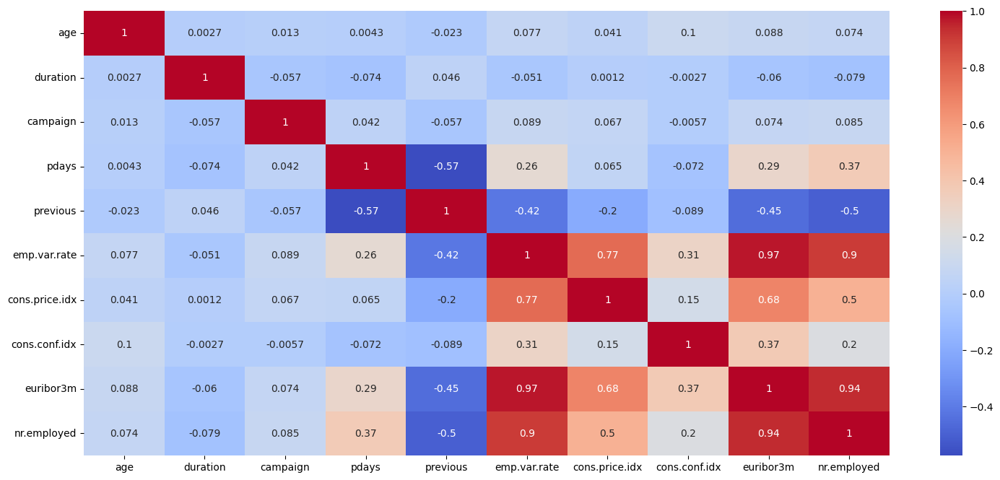

In [ ]:
figure=plt.figure(figsize=(18,8))
sns.heatmap(correlation,annot=True,cmap='coolwarm')
plt.show()

##4. Encoding

In [ ]:
cat_col=[]
for i in df.columns:
  if df[i].dtype=='object':
    cat_col.append(i)

cat_col

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'day_of_week',
 'poutcome',
 'y']

In [ ]:
#We will use VIF
#Lets encode first
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()

labelmap={}

for i in cat_col:
  df[i]=le.fit_transform(df[i])
  labelmap[i]=dict(zip(le.classes_,le.transform(le.classes_)))
  print(f'{i} ; {labelmap[i]}')


job ; {'admin.': np.int64(0), 'blue-collar': np.int64(1), 'entrepreneur': np.int64(2), 'housemaid': np.int64(3), 'management': np.int64(4), 'retired': np.int64(5), 'self-employed': np.int64(6), 'services': np.int64(7), 'student': np.int64(8), 'technician': np.int64(9), 'unemployed': np.int64(10), 'unknown': np.int64(11)}
marital ; {'divorced': np.int64(0), 'married': np.int64(1), 'single': np.int64(2), 'unknown': np.int64(3)}
education ; {'basic.4y': np.int64(0), 'basic.6y': np.int64(1), 'basic.9y': np.int64(2), 'high.school': np.int64(3), 'illiterate': np.int64(4), 'professional.course': np.int64(5), 'university.degree': np.int64(6), 'unknown': np.int64(7)}
default ; {'no': np.int64(0), 'unknown': np.int64(1), 'yes': np.int64(2)}
housing ; {'no': np.int64(0), 'unknown': np.int64(1), 'yes': np.int64(2)}
loan ; {'no': np.int64(0), 'unknown': np.int64(1), 'yes': np.int64(2)}
contact ; {'cellular': np.int64(0), 'telephone': np.int64(1)}
month ; {'apr': np.int64(0), 'aug': np.int64(1), 'de

In [ ]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,3,1,0,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57.0,7,1,3,1,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37.0,7,1,3,0,2,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40.0,0,1,1,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56.0,7,1,3,0,0,2,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0


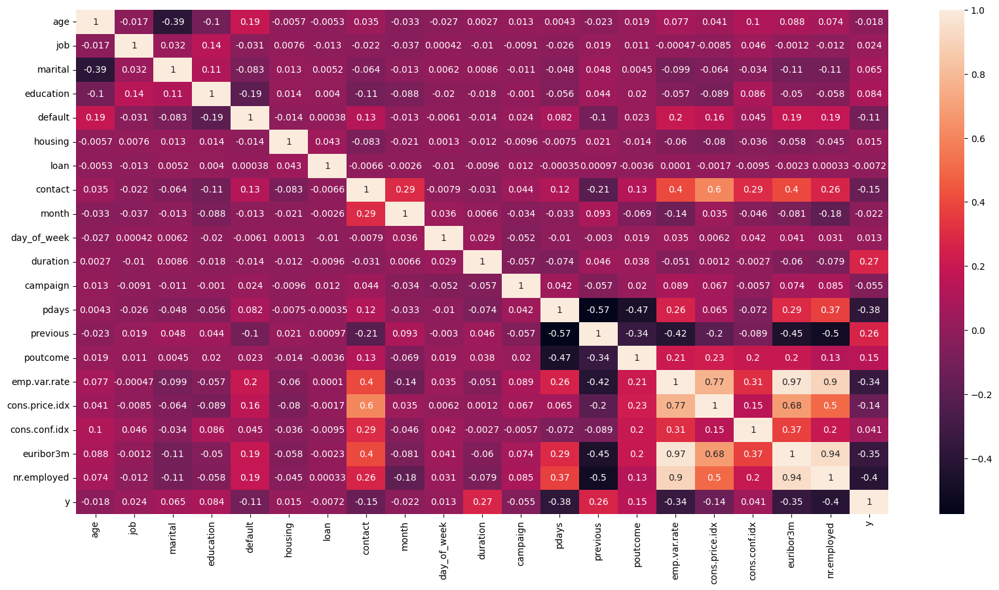

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(),annot=True)
plt.show()

##5. Multi-Correlation with all columns

Now we will do Variance Inflation Factor  (Multi collinearity) for numerical data only, there is RFE which works on both numerical and categorical data
* VIF score = 1 (Ideal independent feature)
* VIF Score <= 5 (good Feature)
* VIF Score > 6 (Multicollinearity Remove)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

In [ ]:
dfc=df

In [ ]:
x=df.drop(columns='y')

In [ ]:
x.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed'],
      dtype='object')

####Iterations for VIF

In [ ]:
#Iteration 1
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

          Features     Vif_score
0              age     22.113993
1              job      2.100861
2          marital      5.690071
3        education      4.560285
4          default      1.411946
5          housing      2.212409
6             loan      1.208306
7          contact      2.942422
8            month      6.685085
9      day_of_week      3.099808
10        duration      3.231026
11        campaign      3.615256
12           pdays    174.895512
13        previous      6.070087
14        poutcome     34.934345
15    emp.var.rate     37.592081
16  cons.price.idx  37885.320838
17   cons.conf.idx    143.576459
18       euribor3m    322.672944
19     nr.employed  43115.201160
********************
Maximum vif column is 19    nr.employed
Name: Features, dtype: object


In [ ]:
df=df.drop('nr.employed',axis=1)

In [ ]:
#Iteration 2
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

          Features   Vif_score
0              age   22.107715
1              job    2.100612
2          marital    5.689362
3        education    4.558657
4          default    1.409350
5          housing    2.212084
6             loan    1.208260
7          contact    2.446094
8            month    5.784547
9      day_of_week    3.098930
10        duration    3.221277
11        campaign    3.602129
12           pdays  174.850562
13        previous    5.973295
14        poutcome   34.669168
15    emp.var.rate   22.287122
16  cons.price.idx  729.560618
17   cons.conf.idx  124.902304
18       euribor3m  130.883838
********************
Maximum vif column is 16    cons.price.idx
Name: Features, dtype: object


In [ ]:
df=df.drop('cons.price.idx',axis=1)

In [ ]:
#Iteration 3
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

         Features  Vif_score
0             age  20.980560
1             job   2.095040
2         marital   5.544426
3       education   4.503309
4         default   1.409322
5         housing   2.210417
6            loan   1.207694
7         contact   2.348235
8           month   5.726141
9     day_of_week   3.084650
10       duration   3.196457
11       campaign   3.585901
12          pdays  95.504094
13       previous   3.040971
14       poutcome  17.519163
15   emp.var.rate  16.710516
16  cons.conf.idx  82.695453
17      euribor3m  93.815501
********************
Maximum vif column is 12    pdays
Name: Features, dtype: object


In [ ]:
#Iteration 3
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

         Features  Vif_score
0             age  20.980560
1             job   2.095040
2         marital   5.544426
3       education   4.503309
4         default   1.409322
5         housing   2.210417
6            loan   1.207694
7         contact   2.348235
8           month   5.726141
9     day_of_week   3.084650
10       duration   3.196457
11       campaign   3.585901
12          pdays  95.504094
13       previous   3.040971
14       poutcome  17.519163
15   emp.var.rate  16.710516
16  cons.conf.idx  82.695453
17      euribor3m  93.815501
********************
Maximum vif column is 12    pdays
Name: Features, dtype: object


In [ ]:
df=df.drop(columns='pdays',axis=1)

In [ ]:
#Iteration 4
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

         Features  Vif_score
0             age  20.156176
1             job   2.091851
2         marital   5.426164
3       education   4.449798
4         default   1.409226
5         housing   2.206690
6            loan   1.207556
7         contact   2.274814
8           month   5.664673
9     day_of_week   3.072542
10       duration   3.184520
11       campaign   3.566503
12       previous   1.497582
13       poutcome   8.132807
14   emp.var.rate  12.914012
15  cons.conf.idx  42.662876
16      euribor3m  63.941291
********************
Maximum vif column is 16    euribor3m
Name: Features, dtype: object


In [ ]:
df=df.drop(columns='euribor3m',axis=1)

In [ ]:
#Iteration 5
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

         Features  Vif_score
0             age  17.204219
1             job   2.085747
2         marital   5.226350
3       education   4.292137
4         default   1.408832
5         housing   2.198757
6            loan   1.207316
7         contact   2.266725
8           month   5.270616
9     day_of_week   3.032416
10       duration   3.177169
11       campaign   3.560596
12       previous   1.479792
13       poutcome   8.004800
14   emp.var.rate   1.547619
15  cons.conf.idx  32.081295
********************
Maximum vif column is 15    cons.conf.idx
Name: Features, dtype: object


In [ ]:
df=df.drop(columns='cons.conf.idx',axis=1)

In [ ]:
#Iteration 6
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

        Features  Vif_score
0            age  11.058997
1            job   2.076503
2        marital   4.372058
3      education   4.193335
4        default   1.407850
5        housing   2.162435
6           loan   1.204070
7        contact   2.242675
8          month   4.871672
9    day_of_week   2.969072
10      duration   3.105927
11      campaign   3.394175
12      previous   1.477225
13      poutcome   7.682693
14  emp.var.rate   1.532256
********************
Maximum vif column is 0    age
Name: Features, dtype: object


In [ ]:
df.drop(columns='age',axis=1,inplace=True)

In [ ]:
#Iteration 7
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

        Features  Vif_score
0            job   2.053348
1        marital   4.351772
2      education   4.013198
3        default   1.323133
4        housing   2.112544
5           loan   1.200876
6        contact   2.241469
7          month   4.605944
8    day_of_week   2.888478
9       duration   2.988925
10      campaign   3.194073
11      previous   1.442307
12      poutcome   6.538761
13  emp.var.rate   1.531336
********************
Maximum vif column is 12    poutcome
Name: Features, dtype: object


In [ ]:
df.drop(columns='poutcome',axis=1,inplace=True)

In [ ]:
#Iteration 8
x=df.drop(columns='y')
vif_data=pd.DataFrame()
vif_data['Features']=x.columns
vif_data['Vif_score']=[vif(x.values,i) for i in range(len(x.columns))]
max_vif_row=vif_data.loc[vif_data['Vif_score']==vif_data['Vif_score'].max()]
a=max_vif_row['Features']
print(vif_data)
print('*'*20)
print(f"Maximum vif column is {a}")

        Features  Vif_score
0            job   2.034164
1        marital   4.135585
2      education   3.788774
3        default   1.313522
4        housing   2.080645
5           loan   1.198855
6        contact   2.225619
7          month   4.490123
8    day_of_week   2.803667
9       duration   2.834777
10      campaign   3.069132
11      previous   1.371570
12  emp.var.rate   1.522988
********************
Maximum vif column is 7    month
Name: Features, dtype: object


#Modelling

In [ ]:
df.head()

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate,y
0,3,1,0,0,0,0,1,6,1,261.0,1.0,0.0,1.1,0
1,7,1,3,1,0,0,1,6,1,149.0,1.0,0.0,1.1,0
2,7,1,3,0,2,0,1,6,1,226.0,1.0,0.0,1.1,0
3,0,1,1,0,0,0,1,6,1,151.0,1.0,0.0,1.1,0
4,7,1,3,0,0,2,1,6,1,307.0,1.0,0.0,1.1,0


In [ ]:
x.columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'day_of_week', 'duration', 'campaign', 'previous',
       'emp.var.rate'],
      dtype='object')

In [ ]:
y=df['y']

##1. Splitting the data

In [ ]:
xTrain,xTest,yTrain,yTest=train_test_split(x,y,train_size=0.7,random_state=42)
print(f"xtrain {xTrain.shape}, yTrain {yTrain.shape}, xTest {xTest.shape}, yTest {yTest.shape}")

xtrain (24615, 13), yTrain (24615,), xTest (10550, 13), yTest (10550,)


##2. Model Creation

In [ ]:
model=LogisticRegression()
model.fit(xTrain,yTrain)

LogisticRegression()

In [ ]:
yPred=model.predict(xTest)

##3. Evaluation


*   Confusion Matrix
*   Accuracy Score
*   Classification Report


In [ ]:
accuracy_score(yTest,yPred)

0.9259715639810426

In [ ]:
confusion_matrix(yTest,yPred)

array([[9577,  192],
       [ 589,  192]])

In [ ]:
print(classification_report(yTest,yPred))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      9769
           1       0.50      0.25      0.33       781

    accuracy                           0.93     10550
   macro avg       0.72      0.61      0.65     10550
weighted avg       0.91      0.93      0.91     10550



* Acurracy - How many Of total predictions were actually correct
    * TP +TN / (TP+TN+FP+FN)

* Precision (Postive Prediction) - When the model predicts Positive class and how many of it is correct
    * TP/(TP + FP)

* Recall(Sensitivity) - How many acutal positive values were correctly predicted
    * TP / TP+FN

* F1 score = A balance Between precision and recall
    * 2 x (precision x recall) / (Precision + Recall)

* Support - The number of actual values occuring in each class in the dataset